# Visualizing Intermediate Activatinos
Based on https://github.com/himanshurawlani/convnet-interpretability-keras/blob/master/Visualizing%20intermediate%20activations/visualizing_intermediate_activations.ipynb

https://towardsdatascience.com/visual-interpretability-for-convolutional-neural-networks-2453856210ce



# First things first

In [1]:
# Log file
metadata = {} 

In [2]:
# Define Dataset

dataset_name = "CarbonPhantom"
subvol_type = "NearestNeighbor"  # Interpolated
col = "Col6"
ground_truth = "CarbonInk"  # NoInk
dataset_num = "2"

#output_prefix = "/home/mhaya2/3d-utilities/SubvolumeVisualization/Result/IntermediateActivations/"
output_prefix = "./"


In [3]:
# Specify the output directory

#output_prefix = "/home/mhaya2/3d-utilities/SubvolumeVisualization/Result/IntermediateActivations/"
output_prefix = "./"
output_path = f"{dataset_name}/{subvol_type}/{col}/{ground_truth}/{dataset_num}"

result_path = output_prefix + output_path

metadata['output_dir'] = result_path

import os
if not os.path.exists(result_path):
    os.makedirs(result_path)

# 3D Volume Rendering Function

In [4]:
import plotly.graph_objects as go

def render_3d(cube, output_file, unit=None):
  X, Y, Z = np.mgrid[0:cube.shape[0], 0:cube.shape[1], 0:cube.shape[2]]
  vol = go.Volume(
      name=dataset_name,
      x = X.flatten(),
      y = Y.flatten(),
      z = Z.flatten(),
      value = cube.flatten(),
      opacity = 0.3,
      opacityscale = 0.3,
      surface_count = 5,
      colorscale='rainbow',
      slices_z = dict(show=True, locations=[10]),
    )
  fig = go.Figure(data=vol)

  if unit:
    vals = []
    texts = []
    for i in range (0,cube.shape[0],8):
      vals.append(i)
      texts.append(str(i*unit))

    fig.update_layout(scene = dict(
                    xaxis = dict(
                        ticktext=texts,
                        tickvals=vals),
                    yaxis = dict(
                        ticktext=texts,
                        tickvals=vals),
                    zaxis = dict(
                        ticktext=texts,
                        tickvals=vals)))
    
  fig.write_image(output_file)
  fig.show()

# Load data

In [5]:
import numpy as np
from pathlib import Path
from PIL import Image
import re
import json

In [6]:
# dataset_name is a directory that contains a series of .tif files
path_prefix = "/home/mhaya2/3d-utilities/SubvolumeVisualization/Data/labeled_subvolume_sampler/"
data_path = f"{dataset_name}/{subvol_type}/{col}/{ground_truth}Individual/{dataset_num}"
dataset = Path(f'{path_prefix}/{data_path}/')
files = list(dataset.glob('*.tif'))
files.sort(key=lambda f: int(re.sub(r'[^0-9]*', "", str(f))))

metadata['dataset'] = str(dataset)

print(files)

[PosixPath('/home/mhaya2/3d-utilities/SubvolumeVisualization/Data/labeled_subvolume_sampler/CarbonPhantom/NearestNeighbor/Col6/CarbonInkIndividual/2/0.tif'), PosixPath('/home/mhaya2/3d-utilities/SubvolumeVisualization/Data/labeled_subvolume_sampler/CarbonPhantom/NearestNeighbor/Col6/CarbonInkIndividual/2/1.tif'), PosixPath('/home/mhaya2/3d-utilities/SubvolumeVisualization/Data/labeled_subvolume_sampler/CarbonPhantom/NearestNeighbor/Col6/CarbonInkIndividual/2/2.tif'), PosixPath('/home/mhaya2/3d-utilities/SubvolumeVisualization/Data/labeled_subvolume_sampler/CarbonPhantom/NearestNeighbor/Col6/CarbonInkIndividual/2/3.tif'), PosixPath('/home/mhaya2/3d-utilities/SubvolumeVisualization/Data/labeled_subvolume_sampler/CarbonPhantom/NearestNeighbor/Col6/CarbonInkIndividual/2/4.tif'), PosixPath('/home/mhaya2/3d-utilities/SubvolumeVisualization/Data/labeled_subvolume_sampler/CarbonPhantom/NearestNeighbor/Col6/CarbonInkIndividual/2/5.tif'), PosixPath('/home/mhaya2/3d-utilities/SubvolumeVisualizati

In [7]:
subvolume = []
images = []
for f in files:
  i = Image.open(f)
  subvolume.append(np.array(Image.open(f), dtype=np.float32))
  images.append(i)

# convert to numpy
subvolume = np.array(subvolume) 
print(np.shape(subvolume))

(48, 48, 48)


# Visualize the Input Data


In [8]:
input_img_path = f'{result_path}/InputImages'

if not os.path.exists(input_img_path):
    os.makedirs(input_img_path)

In [9]:
import matplotlib.pyplot as plt

## See the original TIFF files

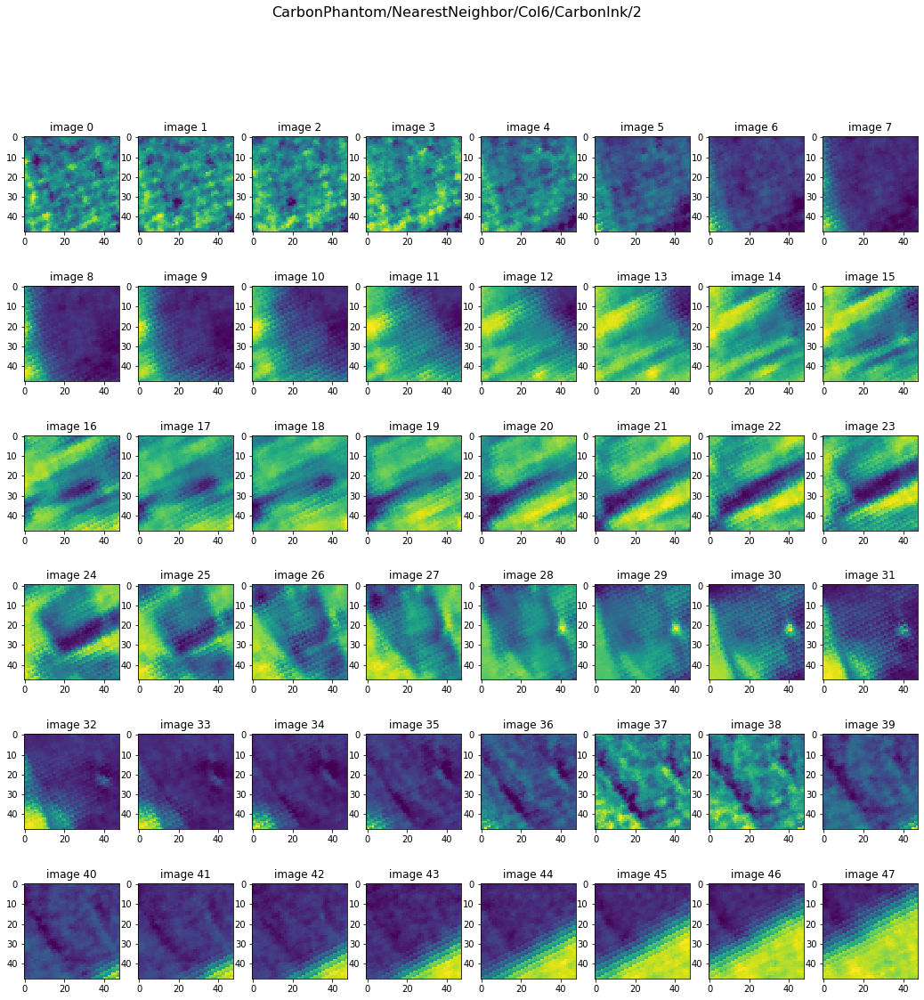

In [10]:

NUM_ROWS = 6
IMGs_IN_ROW = 8

f, ax_arr = plt.subplots(NUM_ROWS, IMGs_IN_ROW, figsize=(18,18))
for j, row in enumerate(ax_arr):
    for i, ax in enumerate(row):
        ax.imshow(images[j*IMGs_IN_ROW+i])
        ax.set_title(f'image {j*IMGs_IN_ROW+i}')

title = output_path
f.suptitle(title, fontsize=16)
plt.savefig(f'{input_img_path}/tiff_slices.jpg')
plt.show() 


## See slices in all 3 directions

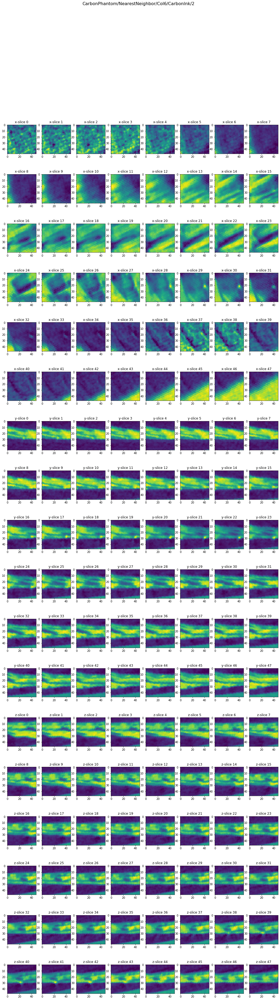

In [11]:
NUM_ROWS = 6
IMGs_IN_ROW = 8

f, ax_arr = plt.subplots(NUM_ROWS*3, IMGs_IN_ROW, figsize=(18,60))
for j, row in enumerate(ax_arr):
    if j < 6:
      for i, ax in enumerate(row):
        ax.imshow(subvolume[j*IMGs_IN_ROW+i, :, :])
        ax.set_title(f'x-slice {j*IMGs_IN_ROW+i}')
    elif j < 12:
      for i, ax in enumerate(row):
        ax.imshow(subvolume[:,(j-6)*IMGs_IN_ROW+i, :])
        ax.set_title(f'y-slice {(j-6)*IMGs_IN_ROW+i}')
    else:
      for i, ax in enumerate(row):
        ax.imshow(subvolume[:,:,(j-12)*IMGs_IN_ROW+i])
        ax.set_title(f'z-slice {(j-12)*IMGs_IN_ROW+i}') 

title = output_path
f.suptitle(title, fontsize=16)
plt.savefig(f'{input_img_path}/slices.jpg')
plt.show() 

## Render Subvolume 3D 

In [12]:
render_3d(subvolume, f'{input_img_path}/plotly.png', unit=12)

# Load the Inkid CNN model

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
from typing import Union

In [14]:
### Taken from model.py

def conv_output_shape(input_shape, kernel_size: Union[int, tuple], stride: Union[int, tuple],
                      padding: Union[int, tuple], dilation: Union[int, tuple] = 1):
    dim = len(input_shape)
    # Accept either ints or tuples for these parameters. If int, then convert into tuple (same value all for all dims).
    if isinstance(kernel_size, int):
        kernel_size = (kernel_size,) * dim
    if isinstance(stride, int):
        stride = (stride,) * dim
    if isinstance(padding, int):
        padding = (padding,) * dim
    if isinstance(dilation, int):
        dilation = (dilation,) * dim
    # https://pytorch.org/docs/stable/nn.html#torch.nn.Conv3d See "Shape:" section.
    return tuple(math.floor((input_shape[d] + 2 * padding[d] - dilation[d] * (kernel_size[d] - 1) - 1) / stride[d] + 1)
                 for d in range(dim))


In [15]:
### Slightly modified version of what is in model.py

class Test3DCNN(torch.nn.Module):

  def __init__(self):

    super().__init__()

    input_shape = [48, 48, 48] # to match the subvolume size we are testing
    in_channels = 1
    batch_norm_momentum = 0.9

    self.relu = torch.nn.ReLU()
    self._in_channels = in_channels
    self._batch_norm = True

    filters = filters = [32, 16, 8, 4]
    paddings = [1, 1, 1, 1]
    kernel_sizes = [3, 3, 3, 3]
    strides = [1, 2, 2, 2]

    self.conv1 = torch.nn.Conv3d(in_channels=in_channels, out_channels=filters[0],
                                     kernel_size=kernel_sizes[0], stride=strides[0], padding=paddings[0])
    torch.nn.init.xavier_uniform_(self.conv1.weight)
    torch.nn.init.zeros_(self.conv1.bias)
    self.batch_norm1 = torch.nn.BatchNorm3d(num_features=filters[0], momentum=batch_norm_momentum)
    shape = conv_output_shape(input_shape, kernel_sizes[0], strides[0], paddings[0])

    self.conv2 = torch.nn.Conv3d(in_channels=filters[0], out_channels=filters[1],
                                  kernel_size=kernel_sizes[1], stride=strides[1], padding=paddings[1])
    torch.nn.init.xavier_uniform_(self.conv2.weight)
    torch.nn.init.zeros_(self.conv2.bias)
    self.batch_norm2 = torch.nn.BatchNorm3d(num_features=filters[1], momentum=batch_norm_momentum)
    shape = conv_output_shape(shape, kernel_sizes[1], strides[1], paddings[1])

    self.conv3 = torch.nn.Conv3d(in_channels=filters[1], out_channels=filters[2],
                                  kernel_size=kernel_sizes[2], stride=strides[2], padding=paddings[2])
    torch.nn.init.xavier_uniform_(self.conv3.weight)
    torch.nn.init.zeros_(self.conv3.bias)
    self.batch_norm3 = torch.nn.BatchNorm3d(num_features=filters[2], momentum=batch_norm_momentum)
    shape = conv_output_shape(shape, kernel_sizes[2], strides[2], paddings[2])

    self.conv4 = torch.nn.Conv3d(in_channels=filters[2], out_channels=filters[3],
                                  kernel_size=kernel_sizes[3], stride=strides[3], padding=paddings[3])
    torch.nn.init.xavier_uniform_(self.conv4.weight)
    torch.nn.init.zeros_(self.conv4.bias)
    self.batch_norm4 = torch.nn.BatchNorm3d(num_features=filters[3], momentum=batch_norm_momentum)
    shape = conv_output_shape(shape, kernel_sizes[3], strides[3], paddings[3])
    self.output_shape = (filters[3],) + shape

  def forward(self, x):
      if self._in_channels > 1:
          x = torch.squeeze(x)
      #y = self.conv1(x)
      #y = self.relu(y)
      #if self._batch_norm:
      #    y = self.batch_norm1(y)
      #y = self.conv2(y)
      #y = self.relu(y)
      #if self._batch_norm:
      #    y = self.batch_norm2(y)
      #y = self.conv3(y)
      #y = self.relu(y)
      #if self._batch_norm:
      #    y = self.batch_norm3(y)
      #y = self.conv4(y)
      #y = self.relu(y)
      #if self._batch_norm:
      #    y = self.batch_norm4(y)

      y = self.relu(self.conv1(x))
      if self._batch_norm:
        y = self.batch_norm1(y)  
      y = self.relu(self.conv2(y))
      if self._batch_norm:
        y = self.batch_norm2(y) 
      y = self.relu(self.conv3(y))
      if self._batch_norm:
        y = self.batch_norm3(y) 
      y = self.relu(self.conv4(y))
      if self._batch_norm:
        y = self.batch_norm4(y)          
      return y

class LinearInkDecoder(torch.nn.Module):
    def __init__(self, drop_rate, input_shape, output_neurons):
        super().__init__()

        self.fc = torch.nn.Linear(int(np.prod(input_shape)), output_neurons)
        self.dropout = torch.nn.Dropout(p=drop_rate)

        self.relu = torch.nn.ReLU()
        self.flatten = torch.nn.Flatten()

    def forward(self, x):
        y = self.flatten(x)
        y = self.fc(y)
        y = self.dropout(y)
        # Add some dimensions to match the dimensionality of label which is always 2D even if shape is (1, 1)
        y = torch.unsqueeze(y, 2)
        y = torch.unsqueeze(y, 3)
        return y


# Helper Functions

In [16]:
def print_model(model):
  for param_tensor in model.state_dict():
      print(param_tensor, "\t", model.state_dict()[param_tensor].size())

# Put Models Together

In [17]:
encoder = Test3DCNN()
decoder = LinearInkDecoder(0.6, encoder.output_shape, 2)
model = torch.nn.Sequential(encoder, decoder)

metadata['model'] = str(model)
print(model)

Sequential(
  (0): Test3DCNN(
    (relu): ReLU()
    (conv1): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (batch_norm1): BatchNorm3d(32, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (conv2): Conv3d(32, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    (batch_norm2): BatchNorm3d(16, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (conv3): Conv3d(16, 8, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    (batch_norm3): BatchNorm3d(8, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (conv4): Conv3d(8, 4, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    (batch_norm4): BatchNorm3d(4, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
  )
  (1): LinearInkDecoder(
    (fc): Linear(in_features=864, out_features=2, bias=True)
    (dropout): Dropout(p=0.6, inplace=False)
    (relu): ReLU()
    (flatten): Flatten()
  )
)


# Load the weights

In [18]:
weight_path = '/home/mhaya2/3d-utilities/SubvolumeVisualization/SavedWeights/'
weight_file = 'm1252444_200000.pt'
model.load_state_dict(torch.load(weight_path+weight_file, map_location=torch.device('cpu'))['model_state_dict'], strict=False)

metadata['saved_weights'] = weight_file
# set to eval mode
model.eval()

# Sanity check
print_model(model)

0.conv1.weight 	 torch.Size([32, 1, 3, 3, 3])
0.conv1.bias 	 torch.Size([32])
0.batch_norm1.weight 	 torch.Size([32])
0.batch_norm1.bias 	 torch.Size([32])
0.batch_norm1.running_mean 	 torch.Size([32])
0.batch_norm1.running_var 	 torch.Size([32])
0.batch_norm1.num_batches_tracked 	 torch.Size([])
0.conv2.weight 	 torch.Size([16, 32, 3, 3, 3])
0.conv2.bias 	 torch.Size([16])
0.batch_norm2.weight 	 torch.Size([16])
0.batch_norm2.bias 	 torch.Size([16])
0.batch_norm2.running_mean 	 torch.Size([16])
0.batch_norm2.running_var 	 torch.Size([16])
0.batch_norm2.num_batches_tracked 	 torch.Size([])
0.conv3.weight 	 torch.Size([8, 16, 3, 3, 3])
0.conv3.bias 	 torch.Size([8])
0.batch_norm3.weight 	 torch.Size([8])
0.batch_norm3.bias 	 torch.Size([8])
0.batch_norm3.running_mean 	 torch.Size([8])
0.batch_norm3.running_var 	 torch.Size([8])
0.batch_norm3.num_batches_tracked 	 torch.Size([])
0.conv4.weight 	 torch.Size([4, 8, 3, 3, 3])
0.conv4.bias 	 torch.Size([4])
0.batch_norm4.weight 	 torch.Size(

# Hook function for recording activations



In [19]:
activation = {}

def get_activation(name):
  # hook signature
  def hook_function(model, input, output):
    activation[name] = output.detach()
  return hook_function

# Create a hook

In [20]:
h1_name = 'conv1'
h1b_name = 'batch_norm1'
h2_name = 'conv2'
h2b_name = 'batch_norm2'
h3_name = 'conv3'
h3b_name = 'batch_norm3'
h4_name = 'conv4'
h4b_name = 'batch_norm4'

h1 = model[0].conv1.register_forward_hook(get_activation(h1_name))
h1b = model[0].batch_norm1.register_forward_hook(get_activation(h1b_name))
h2 = model[0].conv2.register_forward_hook(get_activation(h2_name))
h2b = model[0].batch_norm2.register_forward_hook(get_activation(h2b_name))
h3 = model[0].conv3.register_forward_hook(get_activation(h3_name))
h3b = model[0].batch_norm3.register_forward_hook(get_activation(h3b_name))
h4 = model[0].conv4.register_forward_hook(get_activation(h4_name))
h4b = model[0].batch_norm4.register_forward_hook(get_activation(h4b_name))

# Add input

In [21]:
subvolume = np.array(subvolume)  # Converting a list to a numpy array

# Add two extra axes
subvolume=subvolume[np.newaxis, np.newaxis, ...]
print("final subvolume input shape:", subvolume.shape)

# Input subvolume
subvolume = torch.from_numpy(subvolume)

final subvolume input shape: (1, 1, 48, 48, 48)


# Run the Model Forward

In [22]:
output=model(subvolume)

metadata['prediction_output'] = str(output)

print(output)

prediction = output.argmax(dim=1).item()
metadata['prediction'] = str(prediction)
#print(prediction)

tensor([[[[-0.3582]],

         [[ 0.5791]]]], grad_fn=<UnsqueezeBackward0>)


In [23]:
#print(activation)
#print(activation[layer].shape)

h1.remove()
h1b.remove()
h2.remove()
h2b.remove()
h3.remove()
h3b.remove()
h4.remove()
h4b.remove()


In [24]:
#activations = activation[layer].numpy()
#activations.shape

conv1_activations = activation[h1_name].numpy()
print("conv1_activations: ", conv1_activations.shape)
bnorm1_activations = activation[h1b_name].numpy()
print("bnorm1_activations: ", bnorm1_activations.shape)

conv2_activations = activation[h2_name].numpy()
print("conv2_activations: ", conv2_activations.shape)
bnorm2_activations = activation[h2b_name].numpy()
print("bnorm2_activations: ", bnorm2_activations.shape)

conv3_activations = activation[h3_name].numpy()
print("conv3_activations: ", conv3_activations.shape)
bnorm3_activations = activation[h3b_name].numpy()
print("bnorm3_activations: ", bnorm3_activations.shape)

conv4_activations = activation[h4_name].numpy()
print("conv4_activations: ", conv4_activations.shape)
bnorm4_activations = activation[h4b_name].numpy()
print("bnorm4_activations: ", bnorm4_activations.shape)

conv1_activations:  (1, 32, 48, 48, 48)
bnorm1_activations:  (1, 32, 48, 48, 48)
conv2_activations:  (1, 16, 24, 24, 24)
bnorm2_activations:  (1, 16, 24, 24, 24)
conv3_activations:  (1, 8, 12, 12, 12)
bnorm3_activations:  (1, 8, 12, 12, 12)
conv4_activations:  (1, 4, 6, 6, 6)
bnorm4_activations:  (1, 4, 6, 6, 6)


# Visualize the Activations on Plotly

In [25]:
activations_path = f'{result_path}/IntermediateActivations'

if not os.path.exists(activations_path):
    os.makedirs(activations_path)

In [26]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
import os


def plot3d_layer_activations(activations, name, colorscale='viridis', dirname=None):
  # activations.shape = (1, n_filter, cube[0], cube[1],  cube[2],  )
  # Try height 300 for each row
  # width 1200

    #TODO: Add the dataset name etc.
    dpath = dirname + '/' + name
    
    if not os.path.exists(dpath):
        os.makedirs(dpath)
    min_val = np.min(activations)
    max_val = np.max(activations)
    
    print("layer: ", name)
    print("Max value: ", max_val)
    print("Min value: ", min_val)
    
    metadata[name] = {"max":str(max_val), "min": str(min_val)}
    n_filters = activations.shape[1]  

    for i in range(n_filters):
        signal = activations[0,i,:,:,:] # resulting shape is 3 dimentions.

        X, Y, Z = np.mgrid[0:signal.shape[0], 0:signal.shape[1], 0:signal.shape[2]]

        fig = go.Figure(data=go.Volume(
            name=dataset_name,
            x = X.flatten(),
            y = Y.flatten(),
            z = Z.flatten(),
            value = signal.flatten(),
            cmin = min_val,
            cmax = max_val,
            opacity = 0.3,
            opacityscale = 0.3,
            surface_count = 8,
            colorscale=colorscale,
            #slices_z = dict(show=True, locations=[10]),
        ))
        
        fig.update_layout(scene = dict(
                    xaxis = dict(showticklabels=False),
                    yaxis = dict(showticklabels=False),
                    zaxis = dict(showticklabels=False)))
    
        filename = name + '_' + str(i) + '.png'
        print ("writing in : ", dpath + '/' + filename)
        
        fig.write_image(dpath + '/' + filename)

  

In [27]:

plot3d_layer_activations(conv1_activations, h1_name + "_activations", colorscale='viridis', dirname = activations_path)

layer:  conv1_activations
Max value:  377181.47
Min value:  -887943.6
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv1_activations/conv1_activations_0.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv1_activations/conv1_activations_1.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv1_activations/conv1_activations_2.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv1_activations/conv1_activations_3.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv1_activations/conv1_activations_4.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv1_activations/conv1_activations_5.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv1_activations/conv1_activations_6.png
writing in :  ./CarbonPhant

In [28]:
plot3d_layer_activations(conv2_activations, h2_name + "_activations", colorscale='viridis', dirname = activations_path)

layer:  conv2_activations
Max value:  232.34769
Min value:  -878.98444
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv2_activations/conv2_activations_0.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv2_activations/conv2_activations_1.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv2_activations/conv2_activations_2.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv2_activations/conv2_activations_3.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv2_activations/conv2_activations_4.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv2_activations/conv2_activations_5.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv2_activations/conv2_activations_6.png
writing in :  ./CarbonPhan

In [29]:
plot3d_layer_activations(conv3_activations, h3_name + "_activations", colorscale='viridis', dirname = activations_path)

layer:  conv3_activations
Max value:  102.67111
Min value:  -166.50972
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv3_activations/conv3_activations_0.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv3_activations/conv3_activations_1.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv3_activations/conv3_activations_2.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv3_activations/conv3_activations_3.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv3_activations/conv3_activations_4.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv3_activations/conv3_activations_5.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv3_activations/conv3_activations_6.png
writing in :  ./CarbonPhan

In [30]:
plot3d_layer_activations(conv4_activations, h4_name + "_activations", colorscale='viridis', dirname = activations_path)

layer:  conv4_activations
Max value:  32.58883
Min value:  -57.028904
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv4_activations/conv4_activations_0.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv4_activations/conv4_activations_1.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv4_activations/conv4_activations_2.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/conv4_activations/conv4_activations_3.png


In [31]:
plot3d_layer_activations(bnorm1_activations, h1b_name + "_activations", colorscale='viridis', dirname = activations_path)

layer:  batch_norm1_activations
Max value:  169.60449
Min value:  -0.9302087
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm1_activations/batch_norm1_activations_0.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm1_activations/batch_norm1_activations_1.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm1_activations/batch_norm1_activations_2.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm1_activations/batch_norm1_activations_3.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm1_activations/batch_norm1_activations_4.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm1_activations/batch_norm1_activations_5.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateAc

In [32]:
plot3d_layer_activations(bnorm2_activations, h2b_name + "_activations", colorscale='viridis', dirname = activations_path)

layer:  batch_norm2_activations
Max value:  16.513868
Min value:  -1.8035822
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm2_activations/batch_norm2_activations_0.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm2_activations/batch_norm2_activations_1.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm2_activations/batch_norm2_activations_2.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm2_activations/batch_norm2_activations_3.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm2_activations/batch_norm2_activations_4.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm2_activations/batch_norm2_activations_5.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateAc

In [33]:
plot3d_layer_activations(bnorm3_activations, h3b_name + "_activations", colorscale='viridis', dirname = activations_path)

layer:  batch_norm3_activations
Max value:  12.678339
Min value:  -1.395921
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm3_activations/batch_norm3_activations_0.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm3_activations/batch_norm3_activations_1.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm3_activations/batch_norm3_activations_2.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm3_activations/batch_norm3_activations_3.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm3_activations/batch_norm3_activations_4.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm3_activations/batch_norm3_activations_5.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateAct

In [34]:
plot3d_layer_activations(bnorm4_activations, h4b_name + "_activations", colorscale='viridis', dirname = activations_path)

layer:  batch_norm4_activations
Max value:  0.49121785
Min value:  -0.018804075
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm4_activations/batch_norm4_activations_0.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm4_activations/batch_norm4_activations_1.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm4_activations/batch_norm4_activations_2.png
writing in :  ./CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2/IntermediateActivations/batch_norm4_activations/batch_norm4_activations_3.png


## Last layers slices

In [35]:
conv4_activations.shape

(1, 4, 6, 6, 6)

In [36]:
def print_slices(layer_activations, name, output_dir):
    n_filters = layer_activations.shape[1]
    
    for n in range(n_filters):
        filter_data = layer_activations[0,n,:,:,:]
        
        NUM_ROWS = 1
        IMGs_IN_ROW = layer_activations.shape[2]

        f, ax_arr = plt.subplots(NUM_ROWS*3, IMGs_IN_ROW, figsize=(18,12))
        for j, row in enumerate(ax_arr):
            if j == 0:
              for i, ax in enumerate(row):
                ax.imshow(filter_data[j*IMGs_IN_ROW+i, :, :])
                ax.set_title(f'x-slices {j*IMGs_IN_ROW+i}')
            elif j == 1:
              for i, ax in enumerate(row):
                ax.imshow(filter_data[:,(j-1)*IMGs_IN_ROW+i, :])
                ax.set_title(f'y-slices {(j-1)*IMGs_IN_ROW+i}')
            else:
              for i, ax in enumerate(row):
                ax.imshow(filter_data[:,:,(j-2)*IMGs_IN_ROW+i])
                ax.set_title(f'z-slices {(j-2)*IMGs_IN_ROW+i}') 


        slices_title = f'{title}_{name}_filter{str(n)}'
        f.suptitle(slices_title, fontsize=16)
        plt.savefig(f'{output_dir}/{name}/filter_{str(n)}.jpg')
        plt.show() 


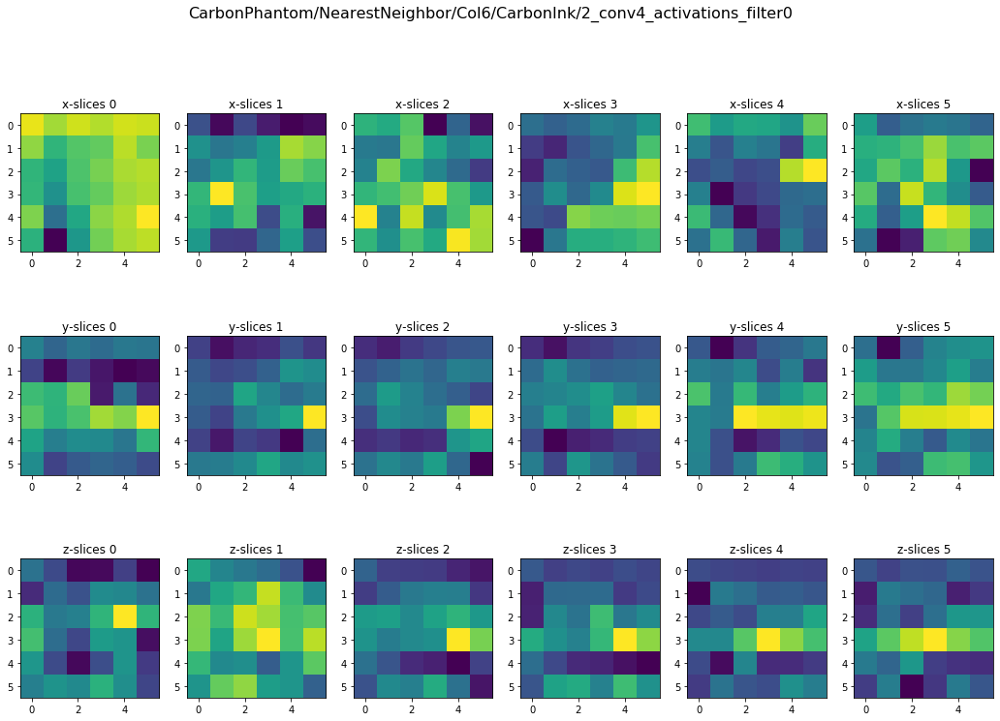

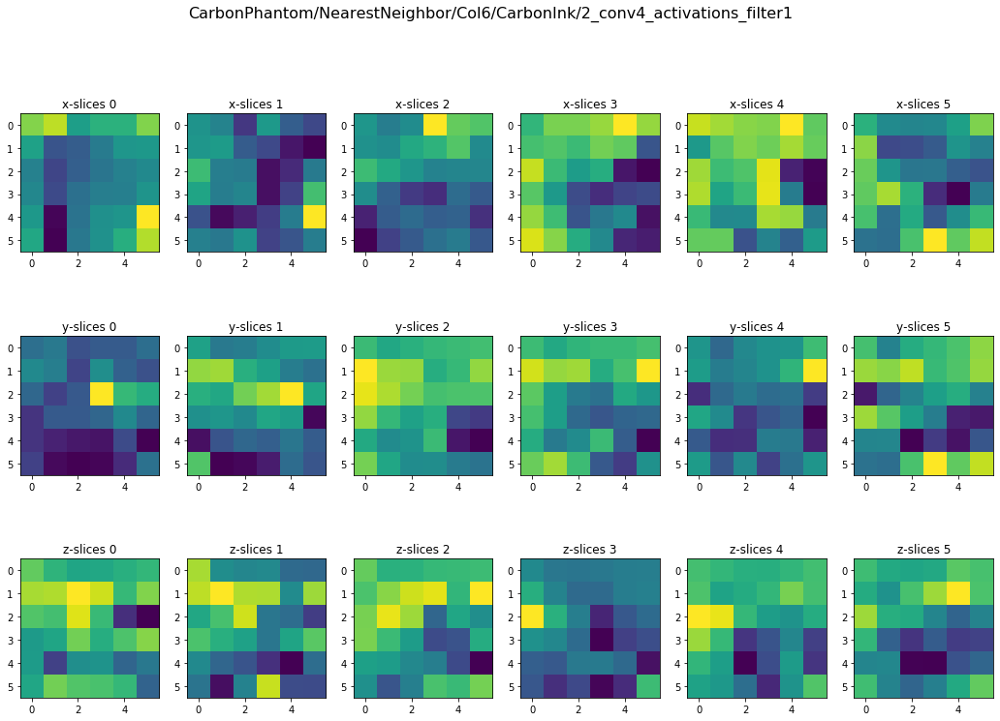

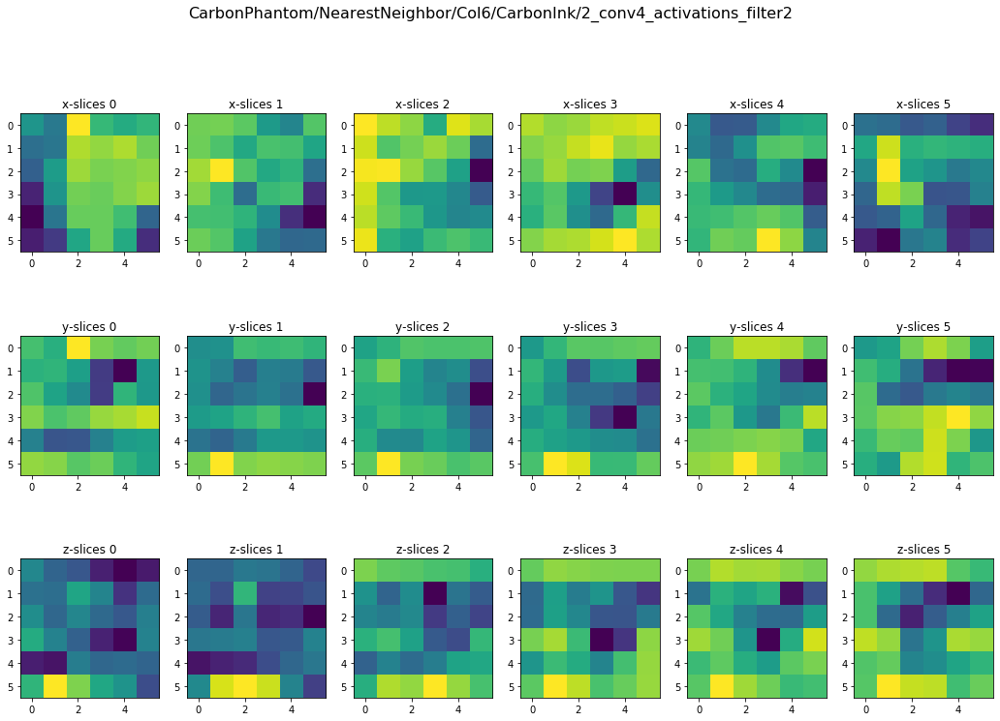

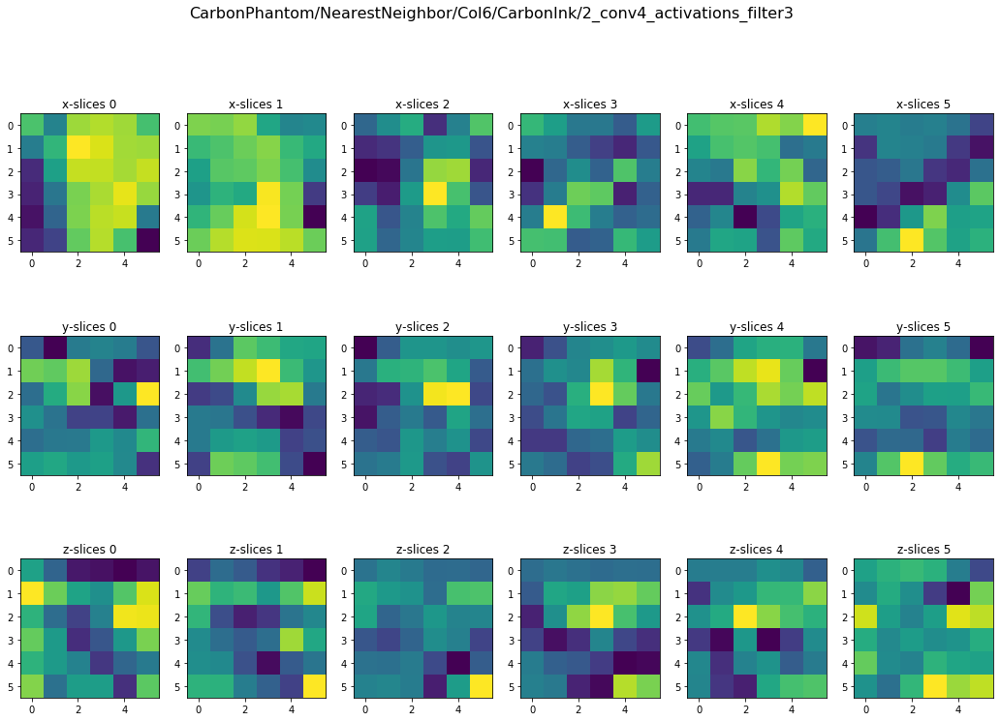

In [37]:
print_slices(conv4_activations, h4_name + '_activations', activations_path)

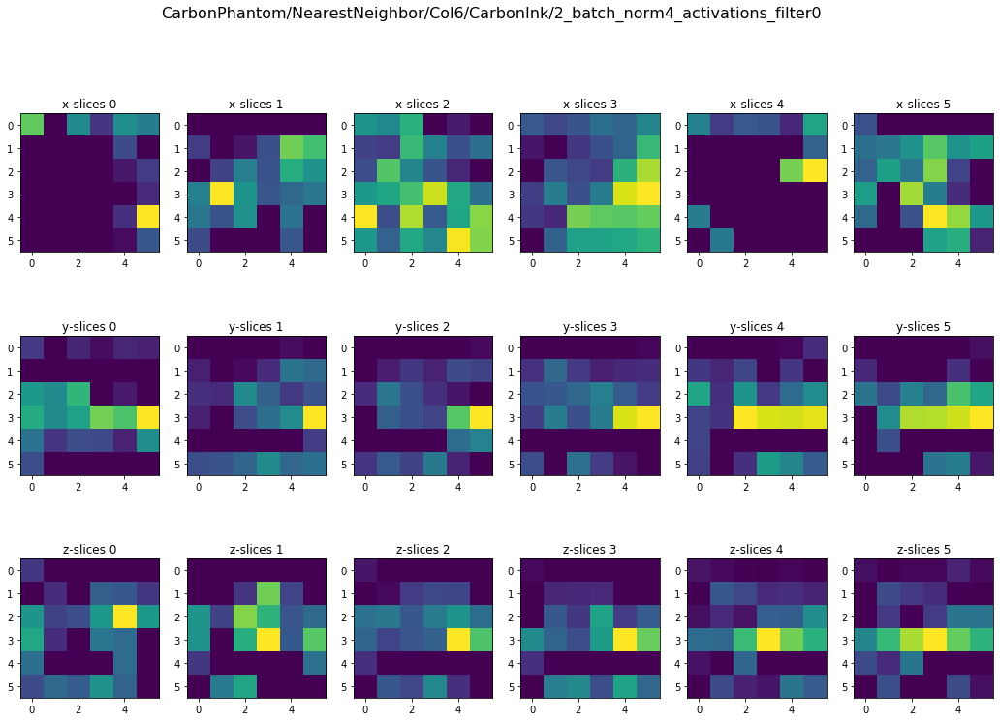

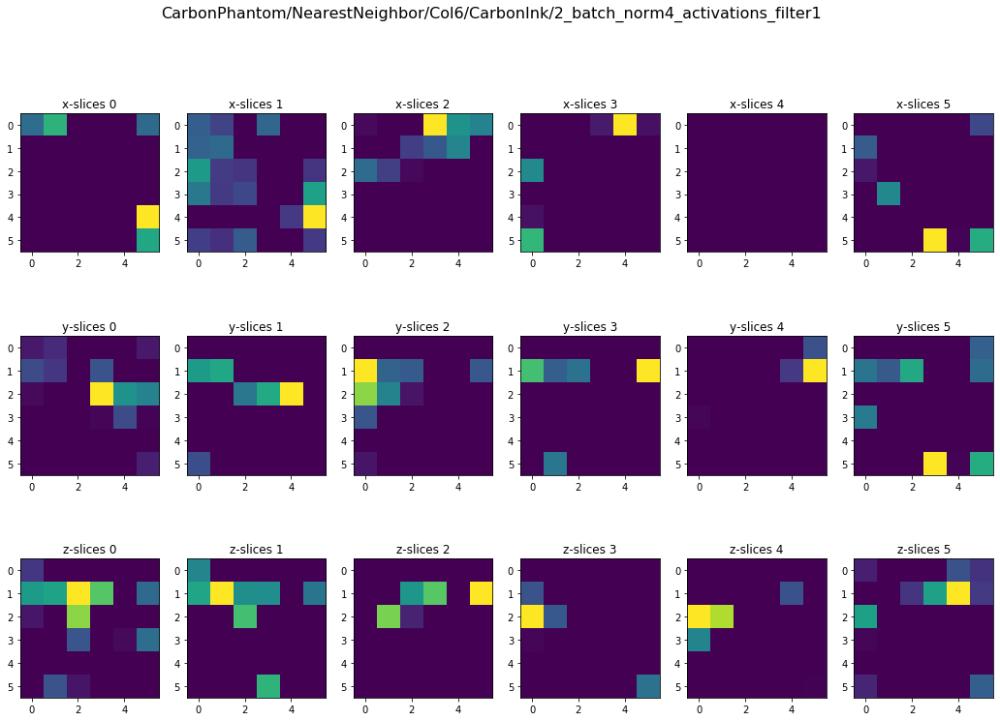

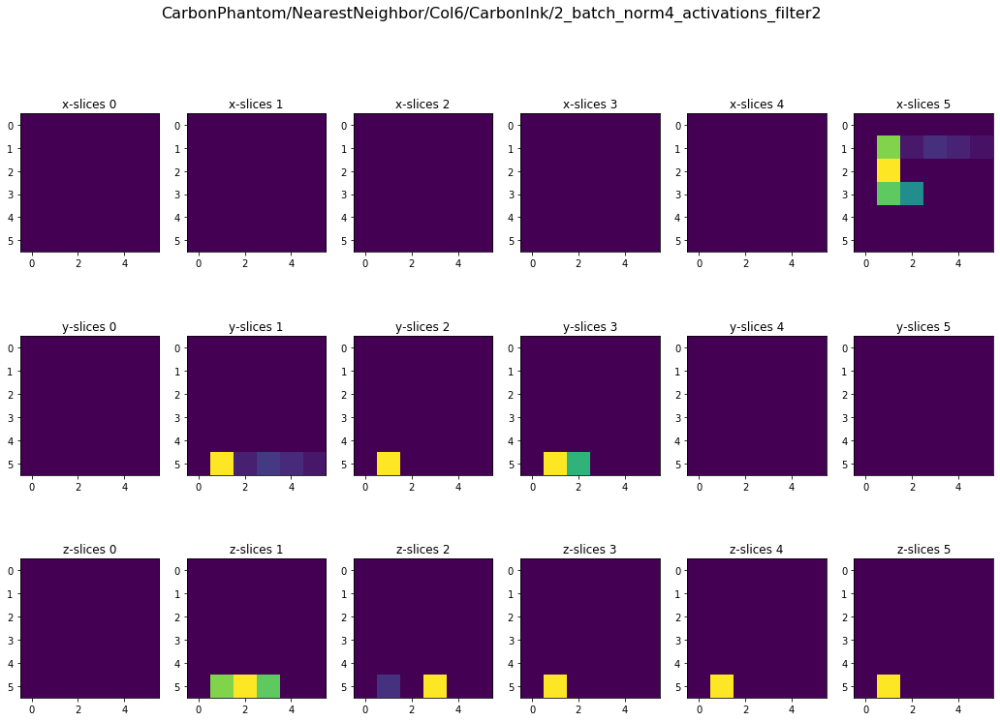

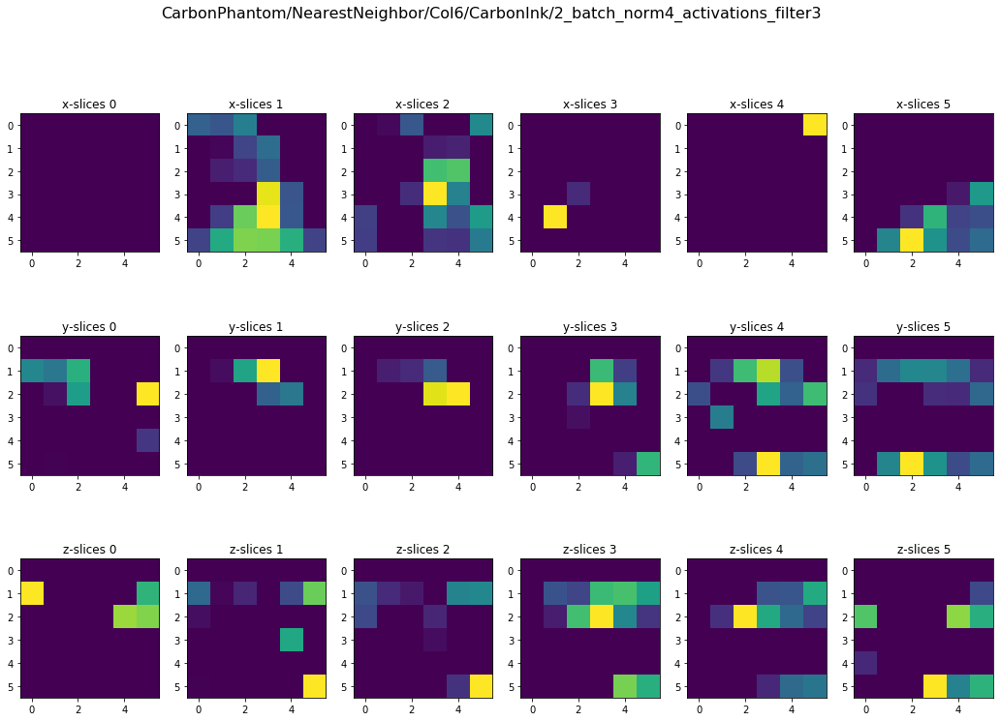

In [38]:
print_slices(bnorm4_activations, h4b_name + '_activations', activations_path)

In [39]:
with open(f"{result_path}/metadata.json", "w") as outfile: 
    json.dump(metadata, outfile, indent=2)

In [40]:
metadata

{'output_dir': './CarbonPhantom/NearestNeighbor/Col6/CarbonInk/2',
 'dataset': '/home/mhaya2/3d-utilities/SubvolumeVisualization/Data/labeled_subvolume_sampler/CarbonPhantom/NearestNeighbor/Col6/CarbonInkIndividual/2',
 'model': 'Sequential(\n  (0): Test3DCNN(\n    (relu): ReLU()\n    (conv1): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))\n    (batch_norm1): BatchNorm3d(32, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)\n    (conv2): Conv3d(32, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))\n    (batch_norm2): BatchNorm3d(16, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)\n    (conv3): Conv3d(16, 8, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))\n    (batch_norm3): BatchNorm3d(8, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)\n    (conv4): Conv3d(8, 4, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))\n    (batch_norm4): BatchNorm3d(4, eps=1e-05, momentum=0.9, affine=T